### Знакомство с новыми данными: данные о квартирах от Сбера

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px

In [3]:
sber_data = pd.read_csv('data/sber_data.csv', sep=',')
display(sber_data.head())
display(sber_data.tail())

FileNotFoundError: [Errno 2] No such file or directory: 'data/sber_data.csv'

In [ ]:
sber_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30471 entries, 0 to 30470
Data columns (total 61 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   id                                     30471 non-null  int64  
 1   full_sq                                30471 non-null  int64  
 2   life_sq                                24088 non-null  float64
 3   floor                                  30304 non-null  float64
 4   sub_area                               30471 non-null  object 
 5   preschool_quota                        23783 non-null  float64
 6   preschool_education_centers_raion      30471 non-null  int64  
 7   school_quota                           23786 non-null  float64
 8   school_education_centers_raion         30471 non-null  int64  
 9   school_education_centers_top_20_raion  30471 non-null  int64  
 10  hospital_beds_raion                    16030 non-null  float64
 11  he

### Задание 2.2

In [ ]:
display(sber_data['sub_area'].nunique())

146

### Задание 2.3

In [ ]:
display(sber_data['price_doc'].max())

np.int64(111111112)

### Задание 2.4

In [ ]:
#Строим коробчатую диаграмму для определения влияния экологической обстановки
#в районе на цену квартиры
fig = px.box(
    data_frame= sber_data,
    x= 'price_doc',
    color= 'ecology',
    title='The impact of the environmental situation on the price of an apartment',
    width= 1000,
    height= 600
)
fig.show()

### Комментарий
Для анализа влияния уровня экологической обстановки в районе на цену квартиры была построена коробчатая диаграмма. Из нее видно, что влияние экологии не существенно влияет на цену квартир в районе. Ниже всего на рынке ценится районе, где нет данных.

### Задание 2.5

In [ ]:
#Построим диаграмму рассеяния, которая покажет, как цена на квартиру
#связана с расстоянием до центра Москвы
fig = px.scatter(
    data_frame= sber_data,
    x= 'price_doc',
    y= 'kremlin_km',
    title= 'The effect of remoteness from the center of Moscow on the price of an apartment',
    width= 1000,
    height= 600
)
fig.show()

### Комментарий
Для анализа влияния удаленности от центра Москвы на цену квартиры была построена диаграмма рассеяния. Из нее видно, что большая часть наблюдений находится в интервале от 0 до 40 км, далее частота резко падает. Также видно, что с ростом расстояния до центра  города постепенно уменьшается значение стоимости квартир.

### Работа с пропусками: как их обнаружить?

In [ ]:
sber_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30471 entries, 0 to 30470
Data columns (total 61 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   id                                     30471 non-null  int64  
 1   full_sq                                30471 non-null  int64  
 2   life_sq                                24088 non-null  float64
 3   floor                                  30304 non-null  float64
 4   sub_area                               30471 non-null  object 
 5   preschool_quota                        23783 non-null  float64
 6   preschool_education_centers_raion      30471 non-null  int64  
 7   school_quota                           23786 non-null  float64
 8   school_education_centers_raion         30471 non-null  int64  
 9   school_education_centers_top_20_raion  30471 non-null  int64  
 10  hospital_beds_raion                    16030 non-null  float64
 11  he

In [ ]:
#Использование медота isnull() для выявления пропусков в данных
display(sber_data.isnull().tail())

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
30466,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
30467,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
30468,False,False,True,False,False,True,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
30469,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
30470,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


#### Список столбцов с пропусками

In [ ]:
#Первый способ - вывод на экран название стобцов, 
#где число пропусков больше 0

cols_null_percent = sber_data.isnull().mean() * 100
cols_with_null = (
    cols_null_percent[cols_null_percent>0].sort_values(ascending=False)
)
display(cols_null_percent)

NameError: name 'sber_data' is not defined

#### Столбчатая диаграмма пропусков

In [ ]:
#Если признаков с цифрами становится слишком много, можно
#воспользоваться столбчатой диаграммой, чтобы визуально оценить
#число пропусков к числу записей

fig = px.bar(
    data_frame= cols_with_null,
    title= 'Distribution of data gaps',
    width= 700,
    height= 500
)
fig.show()

#### Тепловая карта пропусков

In [ ]:
#Ее часто используют, когда солбцов с пропускми не так много (меньше 10).
#Она позволяет понять не только соотношение пропусков в данных, но и
#их характерное местоположение в таблице

cols = cols_with_null.index

fig = px.imshow(
    sber_data[cols].isnull(),
    color_continuous_scale= ['blue', 'yellow'],
    title= 'Heat map of passes'
)
fig.show()

### Работа с пропусками: методы обработки

#### Отбрасывание записей и признаков

In [ ]:
drop_data = sber_data.copy()
thresh = drop_data.shape[0] * 0.7
drop_data = drop_data.dropna(thresh=thresh, axis=1)
drop_data = drop_data.dropna(how='any', axis=0)
drop_data.isnull().mean()

id                                       0.0
full_sq                                  0.0
life_sq                                  0.0
floor                                    0.0
sub_area                                 0.0
preschool_quota                          0.0
preschool_education_centers_raion        0.0
school_quota                             0.0
school_education_centers_raion           0.0
school_education_centers_top_20_raion    0.0
healthcare_centers_raion                 0.0
university_top_20_raion                  0.0
sport_objects_raion                      0.0
additional_education_raion               0.0
culture_objects_top_25_raion             0.0
shopping_centers_raion                   0.0
office_raion                             0.0
oil_chemistry_raion                      0.0
railroad_terminal_raion                  0.0
nuclear_reactor_raion                    0.0
metro_min_avto                           0.0
metro_km_avto                            0.0
metro_min_

In [ ]:
display(drop_data.shape)

(20888, 60)

#### Заполнение недостающих значений константами

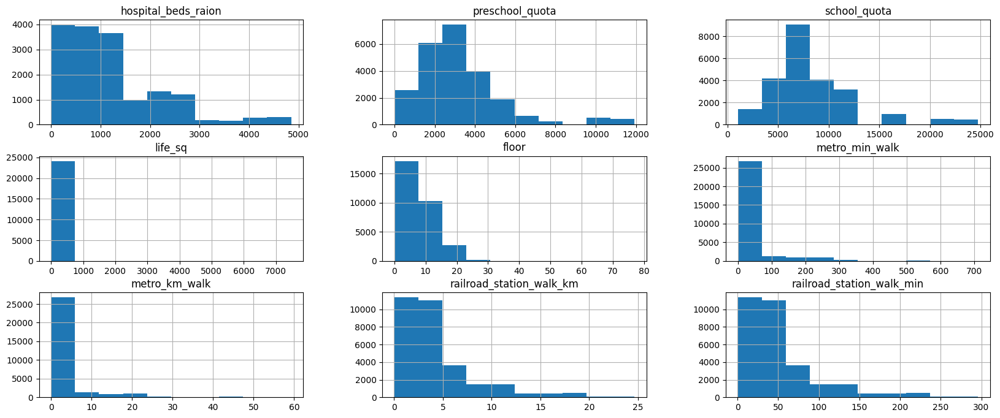

In [ ]:
cols = cols_with_null.index
sber_data[cols].hist(figsize=(20, 8));

In [ ]:
fill_data = sber_data.copy()
values = {
    'life_sq': fill_data['full_sq'],
    'metro_min_walk': fill_data['metro_min_walk'].median(),
    'metro_km_walk': fill_data['metro_km_walk'].median(),
    'railroad_station_walk_km':
fill_data['railroad_station_walk_km'].median(),
    'railroad_station_walk_min':
fill_data['railroad_station_walk_min'].median(),
    'hospital_beds_raion':
fill_data['hospital_beds_raion'].mode()[0],
    'preschool_quota': fill_data['preschool_quota'].mode()[0],
    'school_quota': fill_data['school_quota'].mode()[0],
    'floor': fill_data['floor'].mode()[0]
}
fill_data = fill_data.fillna(values)
fill_data.isnull().mean()

id                   0.0
full_sq              0.0
life_sq              0.0
floor                0.0
sub_area             0.0
                    ... 
theater_km           0.0
museum_km            0.0
ecology              0.0
mosque_count_1000    0.0
price_doc            0.0
Length: 61, dtype: float64

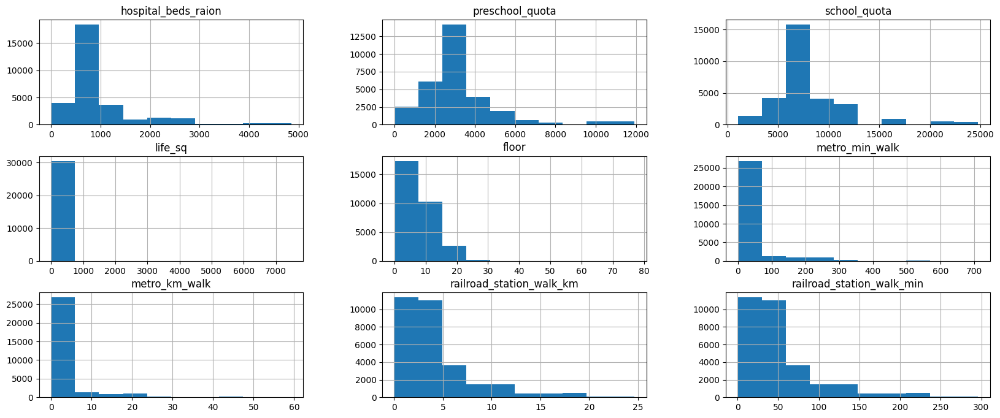

In [ ]:
cols = cols_with_null.index
fill_data[cols].hist(figsize=(20, 8));

### Заполнение недостающих значений константами с добавлением индикатора

In [ ]:
indicator_data = sber_data.copy()
for col in cols_with_null.index:
    indicator_data[col + '_was_null'] = indicator_data[col].isnull()
values = {
    'life_sq': indicator_data['full_sq'],
    'metro_min_walk': indicator_data['metro_min_walk'].median(),
    'metro_km_walk': indicator_data['metro_km_walk'].median(),
    'railroad_station_walk_km':
indicator_data['railroad_station_walk_km'].median(),
    'railroad_station_walk_min':
indicator_data['railroad_station_walk_min'].median(),
    'hospital_beds_raion':
indicator_data['hospital_beds_raion'].mode()[0],
    'preschool_quota': indicator_data['preschool_quota'].mode()[0],
    'school_quota': indicator_data['school_quota'].mode()[0],
    'floor': indicator_data['floor'].mode()[0]
}
indicator_data = indicator_data.fillna(values)
indicator_data.isnull().mean()

id                                    0.0
full_sq                               0.0
life_sq                               0.0
floor                                 0.0
sub_area                              0.0
                                     ... 
floor_was_null                        0.0
metro_min_walk_was_null               0.0
metro_km_walk_was_null                0.0
railroad_station_walk_km_was_null     0.0
railroad_station_walk_min_was_null    0.0
Length: 70, dtype: float64

In [ ]:
display(indicator_data.head())

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,price_doc,hospital_beds_raion_was_null,preschool_quota_was_null,school_quota_was_null,life_sq_was_null,floor_was_null,metro_min_walk_was_null,metro_km_walk_was_null,railroad_station_walk_km_was_null,railroad_station_walk_min_was_null
0,1,43,27.0,4.0,Bibirevo,5001.0,5,11065.0,5,0,...,5850000,False,False,False,False,False,False,False,False,False
1,2,34,19.0,3.0,Nagatinskij Zaton,3119.0,5,6237.0,8,0,...,6000000,False,False,False,False,False,False,False,False,False
2,3,43,29.0,2.0,Tekstil'shhiki,1463.0,4,5580.0,7,0,...,5700000,False,False,False,False,False,False,False,False,False
3,4,89,50.0,9.0,Mitino,6839.0,9,17063.0,10,0,...,13100000,True,False,False,False,False,False,False,False,False
4,5,77,77.0,4.0,Basmannoe,3240.0,7,7770.0,9,0,...,16331452,False,False,False,False,False,False,False,False,False


#### Комбинирование методов

In [ ]:
combine_data = sber_data.copy()

n = combine_data.shape[0]
thresh = n * 0.7
combine_data = combine_data.dropna(thresh=thresh, axis=1)

m = combine_data.shape[1]
combine_data = combine_data.dropna(thresh=m-2, axis=0)

values = {
    'life_sq': combine_data['full_sq'],
    'metro_min_walk': combine_data['metro_min_walk'].median(),
    'metro_km_walk': combine_data['metro_km_walk'].median(),
    'railroad_station_walk_km':
combine_data['railroad_station_walk_km'].median(),
    'railroad_station_walk_min':
combine_data['railroad_station_walk_min'].median(),
    'preschool_quota': combine_data['preschool_quota'].mode()[0],
    'school_quota': combine_data['school_quota'].mode()[0],
    'floor': combine_data['floor'].mode()[0]
}

combine_data = combine_data.fillna(values)
display(combine_data.isnull().mean())


id                                       0.0
full_sq                                  0.0
life_sq                                  0.0
floor                                    0.0
sub_area                                 0.0
preschool_quota                          0.0
preschool_education_centers_raion        0.0
school_quota                             0.0
school_education_centers_raion           0.0
school_education_centers_top_20_raion    0.0
healthcare_centers_raion                 0.0
university_top_20_raion                  0.0
sport_objects_raion                      0.0
additional_education_raion               0.0
culture_objects_top_25_raion             0.0
shopping_centers_raion                   0.0
office_raion                             0.0
oil_chemistry_raion                      0.0
railroad_terminal_raion                  0.0
nuclear_reactor_raion                    0.0
metro_min_avto                           0.0
metro_km_avto                            0.0
metro_min_

In [ ]:
display(combine_data.shape)

(26800, 60)

### Методы выявления выбросов

#### Методы ручного поиска и здравого смысла

In [ ]:
#Расчет статистических показателей для определение выбросов
sber_data['life_sq'].describe()

count    24088.000000
mean        34.403271
std         52.285733
min          0.000000
25%         20.000000
50%         30.000000
75%         43.000000
max       7478.000000
Name: life_sq, dtype: float64

In [ ]:
#Поиск квартир с нулевой жилой площадью
print(sber_data[sber_data['life_sq'] ==0].shape[0])

45


In [ ]:
#Выведем здания с жилой площадью более 7.000 квадратных метров
display(sber_data[sber_data['life_sq'] > 7000])

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
13546,13549,79,7478.0,8.0,Poselenie Voskresenskoe,NaN,0,NaN,0,0,...,5.072389,1.210613,0.826052,1.582378,0.756119,21.472421,14.917332,no data,0,7705000


In [ ]:
#Найдем количество квартир, у которых жилая площадь больше, 
#чем суммарная
outliers = sber_data[sber_data['life_sq'] > sber_data['full_sq']]
print(outliers.shape[0])

37


In [ ]:
#Удаление ошибочных записей по индексам
cleaned = sber_data.drop(outliers.index, axis=0)
print(f'Результирующее число записей: {cleaned.shape[0]}')

Результирующее число записей: 30434


In [ ]:
#Рассмотрим признак числа этажей
display(sber_data['floor'].describe())

count    30304.000000
mean         7.670803
std          5.319989
min          0.000000
25%          3.000000
50%          6.500000
75%         11.000000
max         77.000000
Name: floor, dtype: float64

In [ ]:
#Проверим квартиры, которые находятся выше 50 этажа
display(sber_data[sber_data['floor'] > 50])

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
23584,23587,57,33.0,77.0,Lomonosovskoe,3091.0,5,8359.0,7,1,...,0.310557,0.731683,0.489763,0.86354,0.863266,2.920671,2.757058,satisfactory,0,13700000


#### Метод межквартильного размаха (метод Тьюки)

In [ ]:
#Построим гистограмму для признака полной площади для визуализации и 
#нахождения выбросов
fig = px.histogram(
    data_frame=sber_data,
    x= 'full_sq',
    title= 'Indicates a full area with emissions',
    width= 1000,
    height= 600
)
fig.show()

In [ ]:
#Построим коробчатую диаграмму для признака полной площади 
#для визуализации и нахождения выбросов
fig = px.box(
    data_frame=sber_data,
    x= 'full_sq',
    title= 'Indicates a full area with emissions',
    width= 1000,
    height= 600
)
fig.show()

In [ ]:
#Напишем функцию для поиска выбросов методом межквартильного размаха
def outliers_iqr(data, feature):
    x = data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75)
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * 1.5)
    upper_bound = quartile_3 + (iqr * 1.5)
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

In [ ]:
#Применим данную функцию к таблице sber_data и признаку full_sq
outliers, cleaned = outliers_iqr(sber_data, 'full_sq')
print(f'Число выбросов по методу Тьюки: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу Тьюки: 963
Результирующее число записей: 29508


In [ ]:
#Построим гистограмму на очищенных данных по методу Тьюки
fig = px.histogram(
    data_frame=cleaned,
    x= 'full_sq',
    title= 'Cleared data using the Tukey method',
    width= 1000,
    height= 600
)
fig.show()

In [ ]:
#Построим коробчатую диаграмму на очищенных данных по методу Тьюки
fig = px.box(
    data_frame=cleaned,
    x= 'full_sq',
    title= 'Cleared data using the Tukey method',
    width= 1000,
    height= 600
)
fig.show()

### Задание 6.1

In [ ]:
def outliers_iqr_mod(data, feature, left=1.5, right=1.5):
    x = data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75)
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * left)
    upper_bound = quartile_3 + (iqr * right)
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

outliers, cleaned = outliers_iqr_mod(sber_data, 'full_sq')
print(f'Число выбросов по методу Тьюки: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу Тьюки: 963
Результирующее число записей: 29508


### Задание 6.2

In [ ]:
def outliers_iqr_mod(data, feature, left=1.5, right=1.5):
    x = data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75)
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * left)
    upper_bound = quartile_3 + (iqr * right)
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

outliers, cleaned = outliers_iqr_mod(sber_data, 'full_sq', left=1, right=6)
print(f'Число выбросов по методу Тьюки: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу Тьюки: 59
Результирующее число записей: 30412


In [ ]:
fig= px.histogram(
    data_frame=cleaned,
    x= 'full_sq',
    title= 'Purified data using the Tukey method with a weakened right and reinforced left border',
    width= 1000,
    height= 600
)
fig.show()

In [ ]:
fig = px.box(
    data_frame=cleaned,
    x= 'full_sq',
    title= 'Purified data using the Tukey method with a weakened right and reinforced left border',
    width= 1000,
    height= 600
)
fig.show()

#### Метод Z-отклонений (метод сигм)

In [ ]:
#Строим гистограмму признака растояния до МКАД
fig = px.histogram(
    data_frame=sber_data,
    x= 'mkad_km',
    title= 'Histogram of the sign of the distance to the Moscow Ring Road',
    width= 1000,
    height= 600,
    nbins= 30
)
fig.show()

In [ ]:
#Строим гистограмму признака растояния до МКАД 
#в логарифмическом масштабе
fig = px.histogram(
    data_frame=sber_data,
    x= np.log(sber_data['mkad_km'] + 1),
    title= 'Histogram of the sign of the distance to the Moscow Ring Road on a logarithmic scale',
    width= 1000,
    height= 600,
    nbins= 30
)
fig.show()

In [ ]:
#Численный показатель ассиметрии можно вычислить с помощью метода skew()
print(np.log(sber_data['mkad_km'] + 1).skew())

-0.14263612203024953


In [ ]:
#Напишем функцию, которая реализует алгоритм метода z-отклонения
def outliers_z_score(data, feature, log_scale=False):
    if log_scale:
        x = np.log(data[feature] + 1)
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - 3*sigma
    upper_bound = mu + 3*sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

In [ ]:
#Выведем размерность результатов функции к таблице sber_data
#и признаку mkad_km
outliers, cleaned = outliers_z_score(sber_data, 'mkad_km', log_scale=True)
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу z-отклонения: 33
Результирующее число записей: 30438


In [ ]:
#Узнаем в каких районах поедставлены выбросы
print(outliers['sub_area'].unique())

['Poselenie Rogovskoe' 'Poselenie Kievskij']


In [ ]:
#Гистограмма прологорифмированного распределения с границами 
#по методу 3-х сигм
log_mkad_km = np.log(sber_data['mkad_km'] + 1)

fig = px.histogram(
    data_frame=sber_data,
    x= log_mkad_km,
    title= 'Histogram of a prologarithmic distribution using the 3 sigma method',
    width= 1000,
    height= 600,
    nbins= 30
)
fig.add_vline(x=log_mkad_km.mean())
fig.add_vline(x=log_mkad_km.mean() - 3*log_mkad_km.std(), line_dash = 'dot')
fig.add_vline(x=log_mkad_km.mean() + 3*log_mkad_km.std(), line_dash = 'dot')

### Задание 6.3

In [ ]:
def outliers_z_score_mod(data, feature, left = 3, right = 3, log_scale=False):
    
    if isinstance(data, str):  
        data = pd.read_csv(data)
        
    if log_scale:
        x = np.log(data[feature] + 1)
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left*sigma
    upper_bound = mu + right*sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

outliers, cleaned = outliers_z_score_mod(sber_data, 'mkad_km', right = 3.5, log_scale=True)
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу z-отклонения: 0
Результирующее число записей: 30471


### Задание 6.5

In [ ]:
#Гистограмма для функции price_doc в логарифмическом масштабе 
#с использованием метода 3 сигм

log_price_doc = np.log(sber_data['price_doc'] + 1)

fig = px.histogram(
    data_frame=sber_data,
    x= log_price_doc,
    title= 'Histogram for the price_doc function on a logarithmic scale using the 3 sigma method',
    width= 1000,
    height= 600,
    nbins= 50
)
fig.add_vline(log_price_doc.mean())
fig.add_vline(log_price_doc.mean() - 3*log_price_doc.std(), line_dash='dot')
fig.add_vline(log_price_doc.mean() + 3*log_price_doc.std(), line_dash='dot')

### Задание 6.6

In [ ]:
def outliers_z_score_mod(data, feature, left = 3, right = 3, log_scale=False):
        
    if log_scale:
        x = np.log(data[feature] + 1)
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left*sigma
    upper_bound = mu + right*sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

outliers, cleaned = outliers_z_score_mod(sber_data, 'price_doc', left = 3.7, right = 3.7, log_scale=True)
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу z-отклонения: 52
Результирующее число записей: 30419


### Задание 6.7

In [ ]:
def outliers_iqr_mod(data, feature, left=1.5, right=1.5, log_scale=False):
    if log_scale:
        x = np.log(data[feature])
    else:
        x = data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75)
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * left)
    upper_bound = quartile_3 + (iqr * right)
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

outliers, cleaned = outliers_iqr_mod(sber_data, 'price_doc', left=3, right=3, log_scale=True)
print(f'Число выбросов по методу Тьюки: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу Тьюки: 92
Результирующее число записей: 30379


### Работа с дубликатами и неинформативными признаками

#### Дубликаты

#### Обнаружение и ликвидация дубликатов

In [ ]:
#Проверим дубликаты в таблице по id
sber_data['id'].nunique() == sber_data.shape[0]

True

In [ ]:
#Поиск полных дубликатов
dupl_columns =  list(sber_data.columns)
dupl_columns.remove('id')

mask = sber_data.duplicated(subset=dupl_columns)
sber_duplicates = sber_data[mask]
print(f'Число найденных дупликатов: {sber_duplicates.shape[0]}')

Число найденных дупликатов: 562


In [ ]:
#Очистим данные от полных дубликатов
sber_dedupped = sber_data.drop_duplicates(subset=dupl_columns)
print(f'Результирующее число записей: {sber_dedupped.shape[0]}')

Результирующее число записей: 29909


### Неинформативные признаки

#### Обнаружение и ликвидация неинформативных призаков

In [ ]:
#Cписок неинформативных признаков
low_information_cols = []

for col in sber_data.columns:
    top_freq = sber_data[col].value_counts(normalize=True).max()
    nunique_ration = sber_data[col].nunique() / sber_data[col].count()
    
    if top_freq > 0.95:
        low_information_cols.append(col)
        print(f'{col}: {round(top_freq*100, 2)}% одинаковых значений')
    if nunique_ration > 0.95:
        low_information_cols.append(col)
        print(f'{col}: {round(nunique_ration*100, 2)}% уникальных значений')    

id: 100.0% уникальных значений
oil_chemistry_raion: 99.03% одинаковых значений
railroad_terminal_raion: 96.27% одинаковых значений
nuclear_reactor_raion: 97.17% одинаковых значений
big_road1_1line: 97.44% одинаковых значений
mosque_count_1000: 98.08% одинаковых значений


In [ ]:
#Удаляем неинформативные признаки из таблицы
information_sber_data = sber_data.drop(low_information_cols, axis=1)
print(f'Результирущее число признаков: {information_sber_data.shape[1]}')

Результирущее число признаков: 55
